In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from imgaug import augmenters as iaa

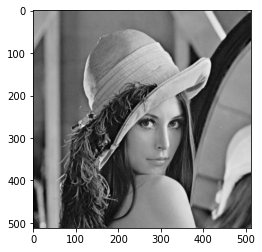

In [2]:
img  = cv2.imread("Lena.png", cv2.IMREAD_GRAYSCALE)
plt.imshow(img, cmap="gray")
plt.show()

In [3]:
 
# row ,col = img.shape
# salt_pepper = []
# for i in range(1, 10):
#     img = cv2.imread("Lena.png", cv2.IMREAD_GRAYSCALE)
#     number_of_pixels = int(10000*i)
#     for j in range(number_of_pixels):
#         x = random.randint(0, row-1)
#         y = random.randint(0, col-1)
#         img[x,y] = 255

#     for j in range(number_of_pixels):
#         x = random.randint(0, row-1)
#         y = random.randint(0, col-1)
#         img[x,y] = 0
#     salt_pepper.append(img)
 

In [4]:
salt_pepper = []

In [5]:
for i in range(0, 10):
    salt_pepper.append(iaa.SaltAndPepper(0.1 + 0.1 * i).augment_image(img))

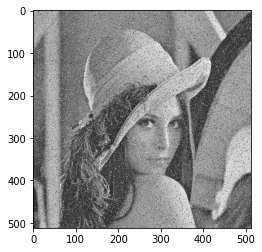

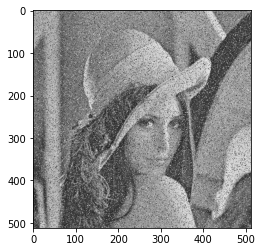

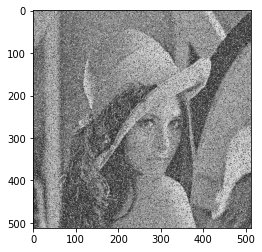

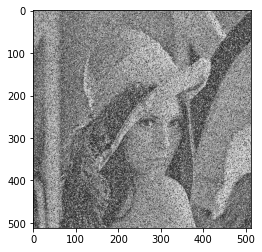

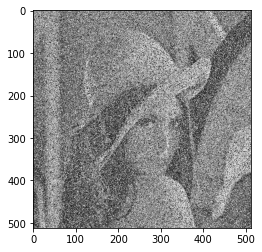

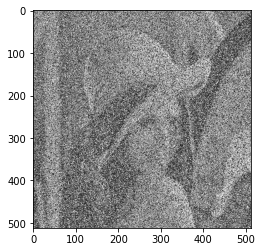

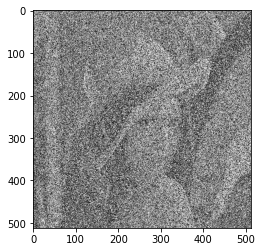

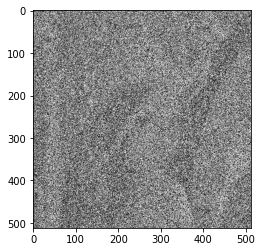

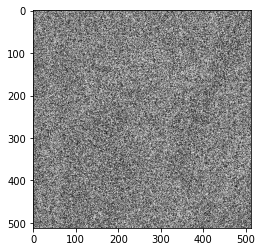

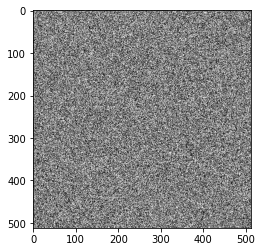

In [6]:
for image in salt_pepper:
    plt.imshow(image , cmap = "gray")
    
    plt.show()

In [7]:
filter_sizes = [3, 5, 7]
sigma =  1


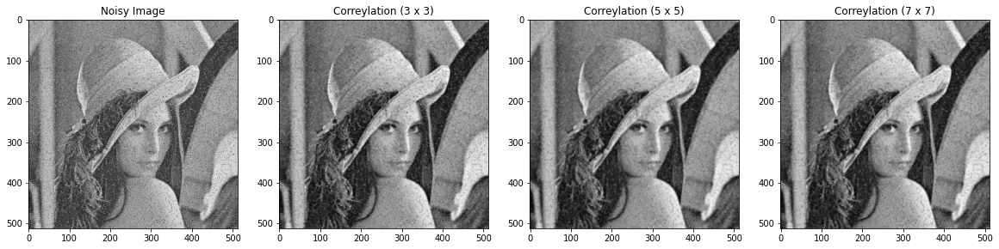

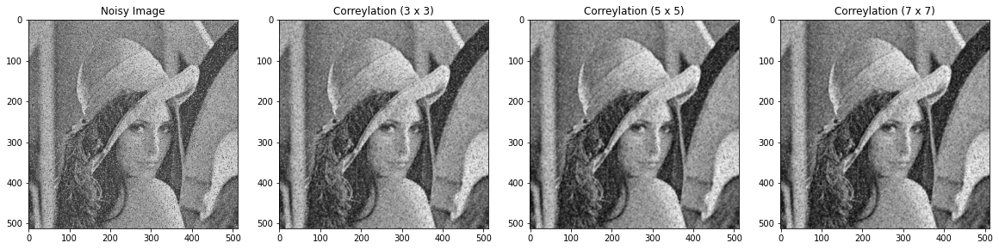

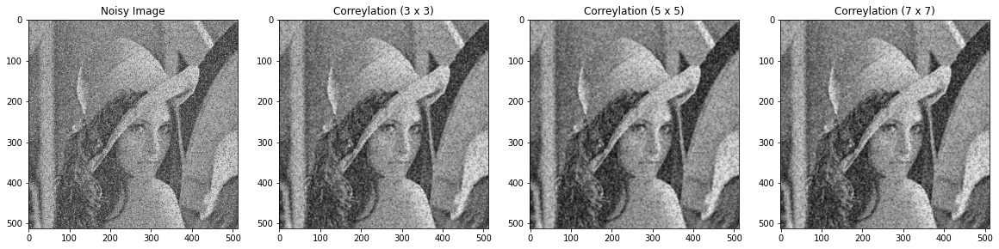

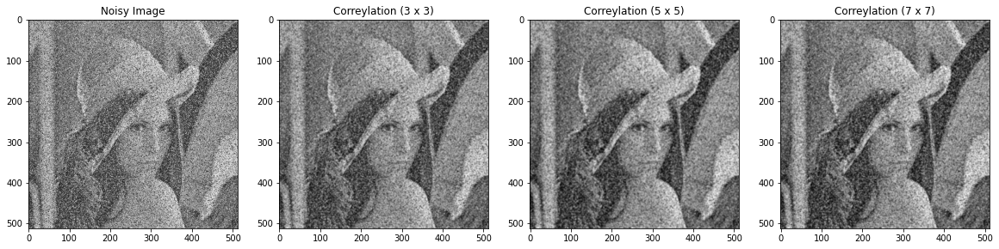

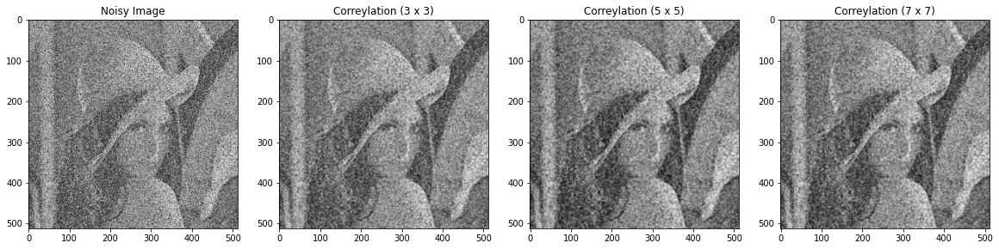

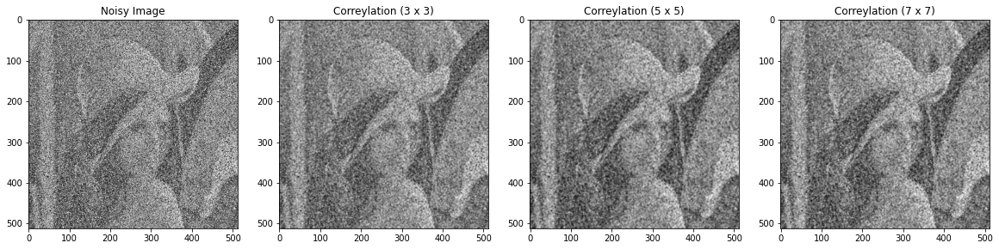

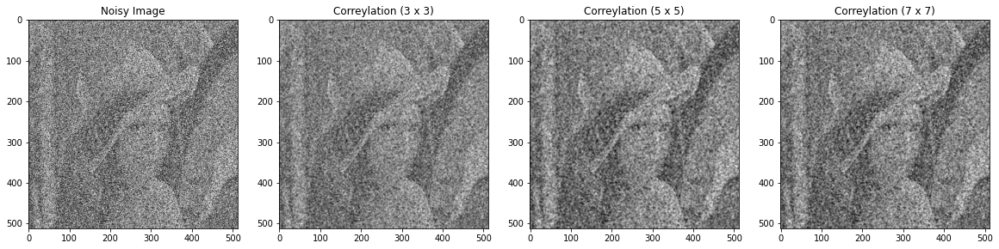

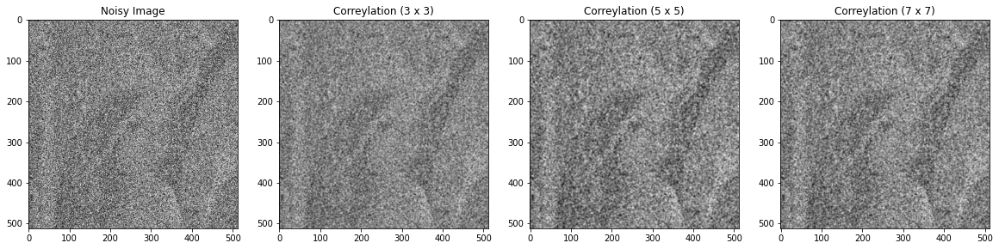

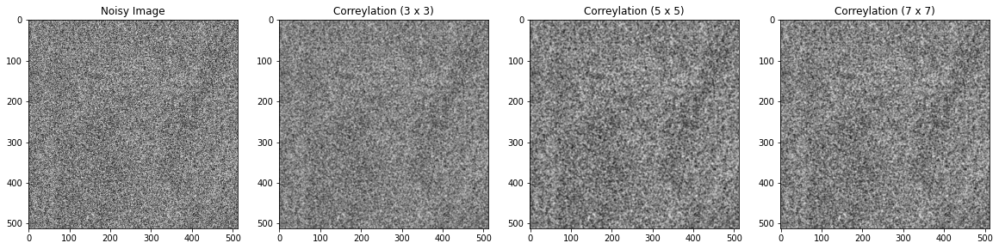

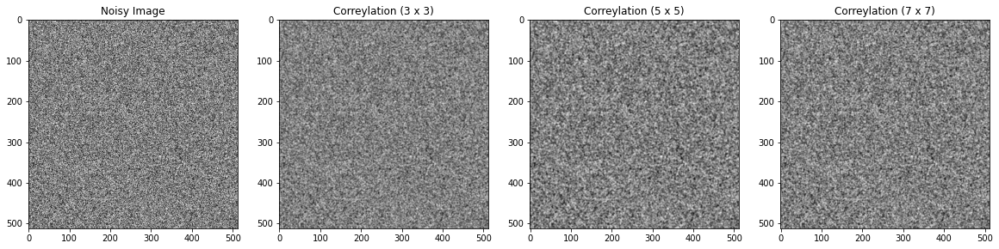

In [8]:
for i in range(len(salt_pepper)):
    noisy_image = salt_pepper[i]
    noisy_image = noisy_image.astype(np.float32)

    # create a figure with two subplots
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    # show the noisy image in the first subplot
    axs[0].imshow(noisy_image, cmap='gray')
    axs[0].set_title('Noisy Image')
    # perform filtering for each filter size
    for j in range(len(filter_sizes)):
        size = filter_sizes[j]
        img1= np.zeros((size,size))
        img1[size//2 ,size//2] = 1
        # apply Gaussian filter with the current size and standard deviation
        gaussian_filter = cv2.GaussianBlur(img1, (size, size), sigma)
        # perform correlation
        correlation = cv2.filter2D(noisy_image, -1, gaussian_filter)
        axs[j+1].imshow(correlation, cmap='gray')
        axs[j+1].set_title(f'Correylation ({size} x {size})')

    # display the figure
    plt.show()


In [9]:
# user defined function to perform correlation
def correlation_func(image, filter):
    # getting the dimensions of the image
    image_height = image.shape[0]
    image_width = image.shape[1]
    # getting the dimensions of the filter
    filter_height = filter.shape[0]
    filter_width = filter.shape[1]
    # creating an empty list to store the filtered image
    filtered_image = []
    # performing correlation
    for i in range(image_height - filter_height + 1):
        for j in range(image_width - filter_width + 1):
            filtered_image.append(np.sum(image[i:i + filter_height, j:j + filter_width] * filter))
    # reshaping the filtered image
    filtered_image = np.array(filtered_image).reshape(image_height - filter_height + 1, image_width - filter_width + 1)
    # returning the filtered image
    return filtered_image


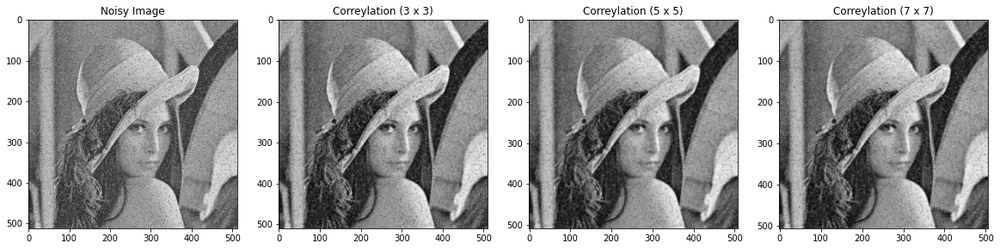

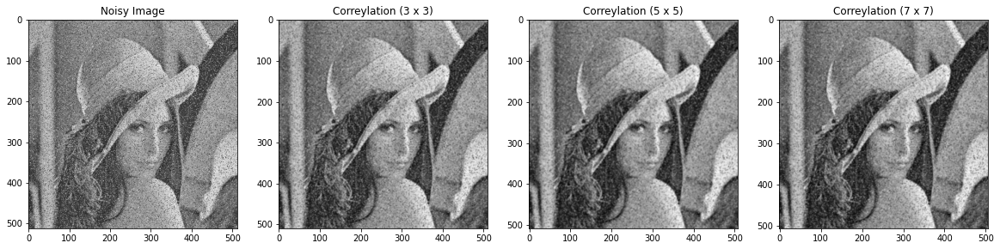

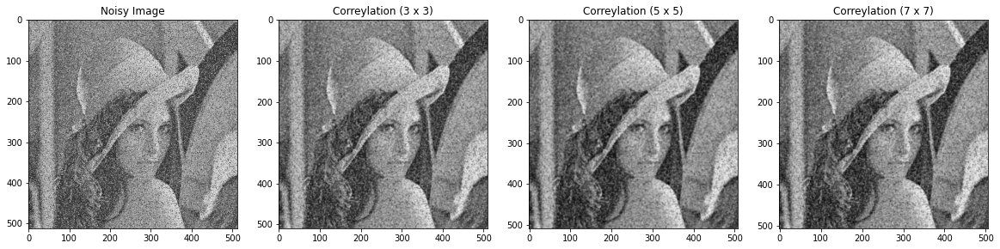

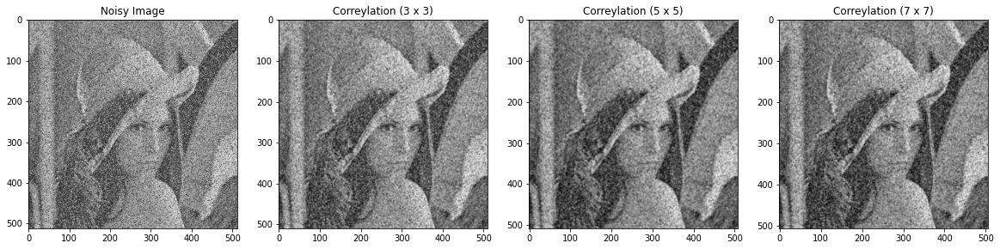

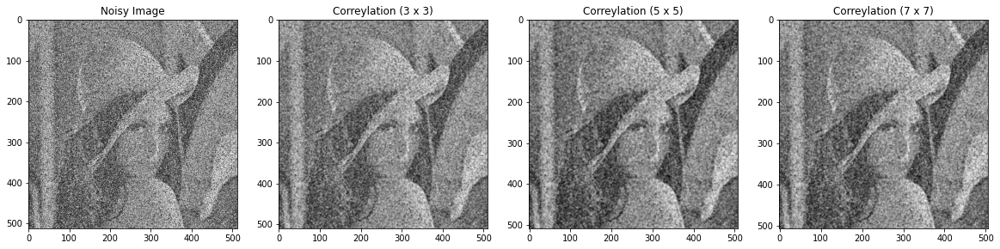

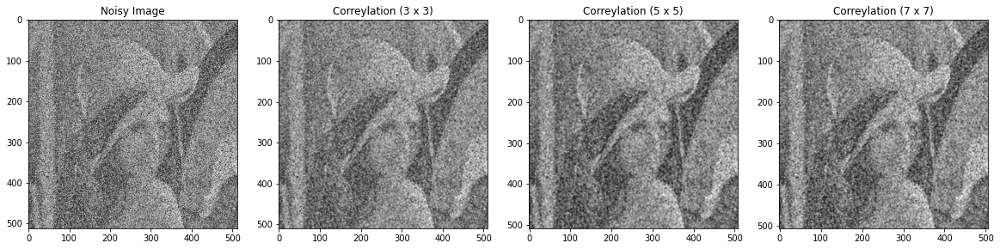

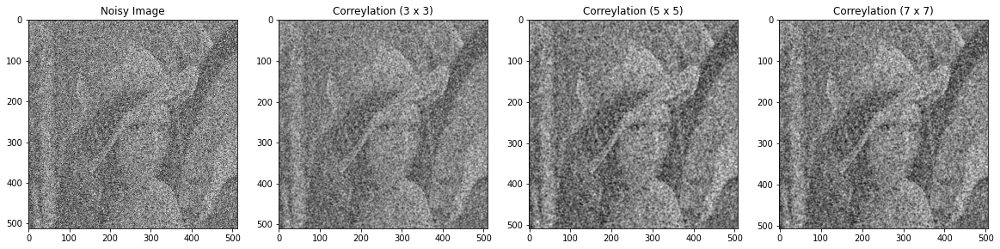

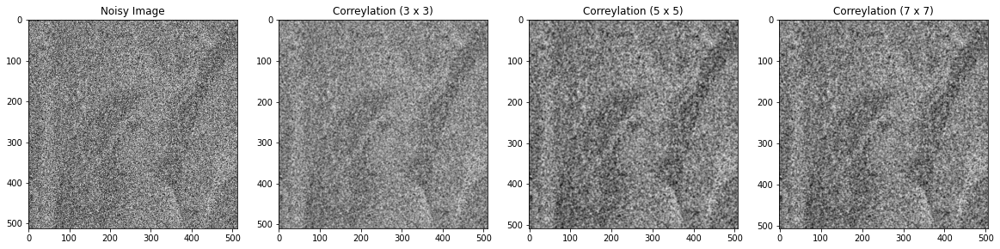

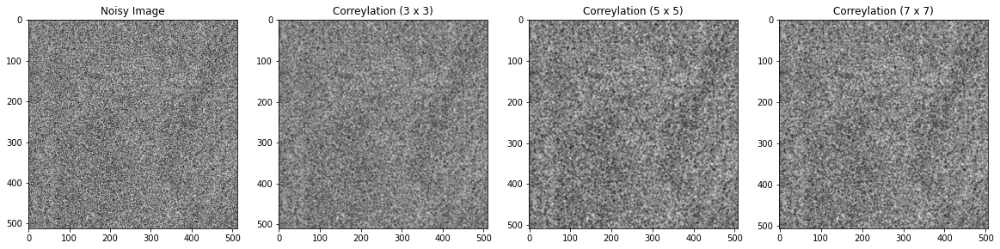

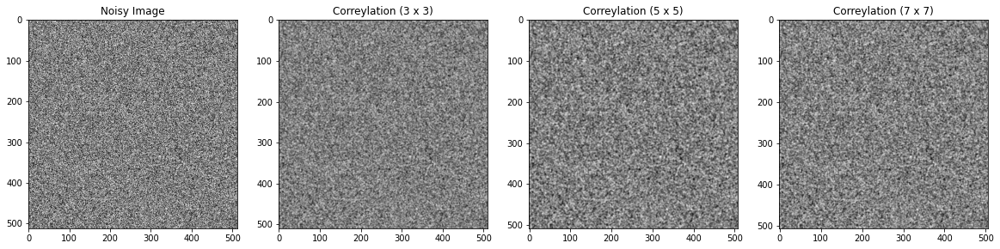

In [11]:
for i in range(len(salt_pepper)):
    noisy_image = salt_pepper[i]
    noisy_image = noisy_image.astype(np.float32)

    # create a figure with two subplots
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))
    # show the noisy image in the first subplot
    axs[0].imshow(noisy_image, cmap='gray')
    axs[0].set_title('Noisy Image')
    # perform filtering for each filter size
    for j in range(len(filter_sizes)):
        size = filter_sizes[j]
        img1= np.zeros((size,size))
        img1[size//2 ,size//2] = 1
        # apply Gaussian filter with the current size and standard deviation
        gaussian_filter = cv2.GaussianBlur(img1, (size, size), sigma)
        # perform correlation
        correlation = correlation_func(noisy_image, gaussian_filter)
        axs[j+1].imshow(correlation, cmap='gray')
        axs[j+1].set_title(f'Correylation ({size} x {size})')

    # display the figure
    plt.show()
